# Présentation des résultats

Chargement des Packages nécessaires

In [20]:
using CSV
using DataFrames
using DataFramesMeta
using Dates
using StatsPlots
using Statistics
using Temporal
using GLM
using TimeSeries: TimeArray 
using StatsBase
using Forecast
using LinearAlgebra

Données

In [21]:

# Fonction pour lire et filtrer les données
function read_and_filter_data(filepath, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    df = CSV.read(filepath, DataFrame, header = header_row, skipto = skip_rows, comment = "#", dateformat = "yyyymmdd", types = Dict(date_column => Date), normalizenames = true)
    df_filtered = filter(row -> year(row[date_column]) >= 1955 && year(row[date_column]) <= 2005, df)
    return df_filtered
end

# Lire tous les fichiers dans un dossier et agréger les données
function aggregate_data_from_folder(folder_path::String, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    files = readdir(folder_path)
    all_data = DataFrame()
    
    for file in files
        filepath = joinpath(folder_path, file)
        df = read_and_filter_data(filepath, date_column, value_column, header_row, skip_rows)
        append!(all_data, df)
    end
    
    # Supprimer les valeurs manquantes
    all_data = filter(row -> row[value_column] != 9, all_data)
    
    # Calculer la moyenne et l'écart type pour chaque date
    
    if value_column == :Tmax
        aggregated_data = @chain all_data begin
            @transform(:YEAR = year.(all_data[!, date_column])) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:Tmax), :DAILY_STD = std(:Tmax)) # Grouper par date et calculer moyenne / écart type
        end
    else
        aggregated_data = @chain all_data begin
            @subset(:Q_TX .!= 9) # Supprimer les valeurs manquantes 
            @transform(:YEAR = year.(:DATE)) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:TX), :DAILY_STD = std(:TX)) # Grouper par date et calculer moyenne / écart type
        end
    end

    return aggregated_data
end

# Chemins des dossiers
data_station_folder = "data_station_extract_script/data_tx"
data_drias_folder = "data_drias/Mod1_temp"

# Agréger les données des dossiers
data_station_aggregated = aggregate_data_from_folder(data_station_folder, :DATE, :TX, 21, 22)
data_drias_aggregated = aggregate_data_from_folder(data_drias_folder, :Date, :Tmax, 60, 61)

# Conversion factor to °C for data_station
factor = 0.1
data_station_aggregated[!, :DAILY_MEAN] .= data_station_aggregated[!, :DAILY_MEAN] * factor
data_station_aggregated[!, :DAILY_STD] .= data_station_aggregated[!, :DAILY_STD] * factor

# Trier les données par date
sort!(data_station_aggregated, :DATE)
sort!(data_drias_aggregated, :Date)

# Convertir les données en séries temporelles
my_ts = TimeArray(data_station_aggregated[!, :DATE], data_station_aggregated[!, :DAILY_MEAN])
my_ts_drias = TimeArray(data_drias_aggregated[!, :Date], data_drias_aggregated[!, :DAILY_MEAN])

# Extraire les valeurs numériques de la série temporelle
data_values = values(my_ts)
data_values_drias = values(my_ts_drias)


11323-element Vector{Float64}:
  9.604000000000001
  8.139333333333333
  7.560666666666666
  5.930666666666666
  5.747333333333334
  5.264666666666667
  6.655333333333332
  5.493333333333334
  4.560666666666665
  3.524666666666666
  ⋮
 12.604666666666667
 12.129333333333335
 10.106666666666666
  8.210666666666665
  4.4479999999999995
  2.962142857142857
  5.997999999999999
  6.299333333333334
  6.6146666666666665

## Premières Analyses

### Autocorrélogrammes

AUTOCORRÉLOGRAMME PARTIEL


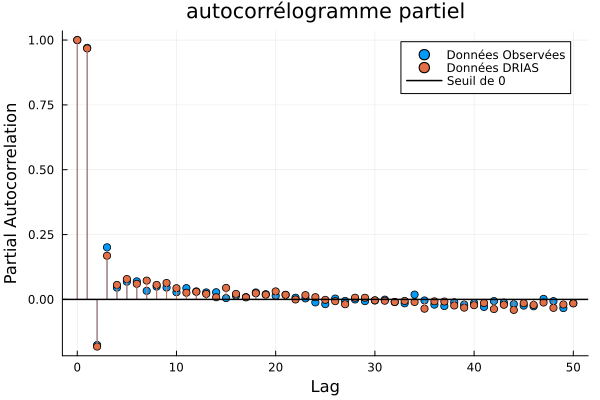

In [22]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values = StatsBase.pacf(data_values, lags)
pacf_values_drias = StatsBase.pacf(data_values_drias, lags)

plot(0:maxlag, pacf_values, label = "Données Observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

AUTOCORRÉLOGRAMME EMPIRIQUE

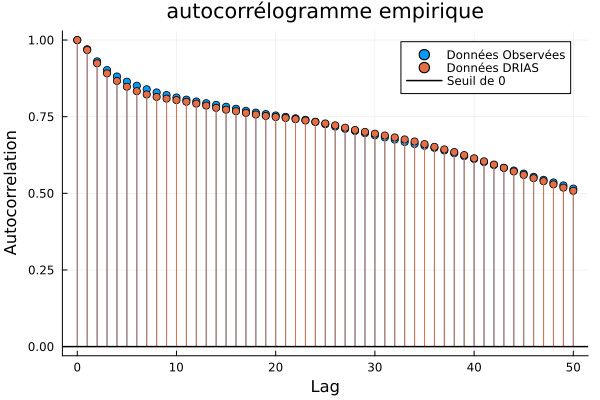

In [23]:
autocor_values = autocor(data_values, lags)
autocor_values_drias = autocor(data_values_drias, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="autocorrélogramme empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

### Séries temporelles et tendances

Tracé des deux avec moyennes mobiles classiques

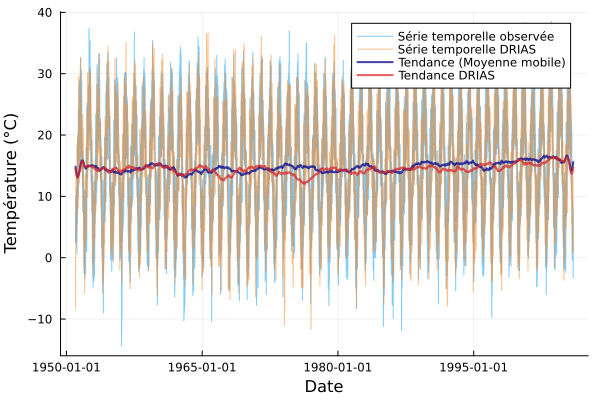

In [24]:
function moyenne_mobile(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, i + window_size ÷ 2)
        trend[i] = mean(@view(data[start_idx:end_idx]))
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_values = moyenne_mobile(df_daily.DAILY_MEAN, 730)
trend_values_drias = moyenne_mobile(df_daily_drias.DAILY_MEAN, 730)

# Convertir les données en une série temporelle
datats = TimeArray(df_daily.DATE, df_daily.DAILY_MEAN)
datats_drias = TimeArray(df_daily_drias.Date, df_daily_drias.DAILY_MEAN)

# Tracer la série temporelle avec la tendance
plot(datats,  alpha=:0.5,label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias,   palette =:tab10, alpha=:0.5, label="Série temporelle DRIAS", xlabel="Date", ylabel="Température (°C)")
plot!(df_daily.DATE, color=:darkblue,alpha=:0.75, trend_values, label="Tendance (Moyenne mobile)", linewidth=2)
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_values_drias, label="Tendance DRIAS", linewidth=2)


Tracé des deux avec moyennes mobiles gaussien


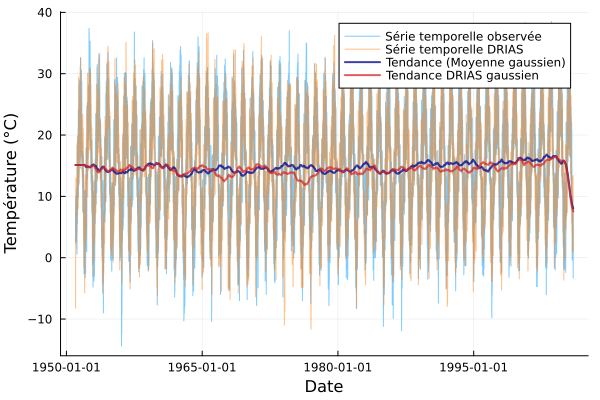

In [25]:

function moyenne_gauss(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        weights = exp.(-(collect(1:window_size) .- (window_size ÷ 2)).^2 / (2 * (window_size / 2)^2))
        weights /= sum(weights)  # Normalisation des poids pour que leur somme soit égale à 1
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, start_idx + window_size - 1)  # Ajustement de la fin de la tranche de données
        data_slice = @view(data[start_idx:end_idx])
        trend[i] = sum(data_slice .* weights[1:length(data_slice)])
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_gauss = moyenne_gauss(df_daily.DAILY_MEAN, 730)
trend_gauss_drias = moyenne_gauss(df_daily_drias.DAILY_MEAN, 730)

# Tracer la série temporelle avec la tendance
plot(datats, alpha=:0.5, label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias, palette =:tab10,alpha=:0.5,label="Série temporelle DRIAS", legend=:topright)
plot!(df_daily.DATE, color=:darkblue,alpha=:0.75,trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)


Calcul des tendances avec le package Forecast

In [26]:
stl_df = stl(df_daily,730; robust=true, spm=true)
stl_df_drias = stl(df_daily_drias,730; robust=true, spm=true)
stl_df.decomposition
stl_df_drias.decomposition

┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165


,Timestamp,Seasonal,Trend,Remainder
,Date,Float64,Float64,Float64
1,1951-01-01,-12.2972,14.7296,-2.93239
2,1951-01-02,-12.1498,14.7304,-3.40059
3,1951-01-03,-12.0067,14.7312,-4.28451
4,1951-01-04,-11.8678,14.732,-4.39427
5,1951-01-05,-11.7329,14.7329,-9.59997
6,1951-01-06,-11.602,14.7337,-11.3917
7,1951-01-07,-11.4748,14.7345,-6.17969
8,1951-01-08,-11.3514,14.7353,-5.76398
9,1951-01-09,-11.2314,14.7362,-3.41474


Tracé des deux avec moyennes mobiles du package Forecast


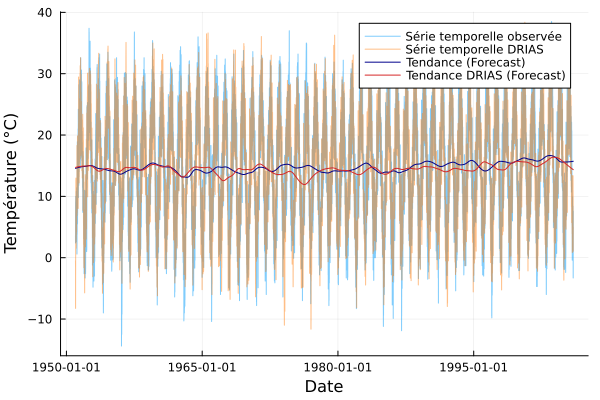

In [27]:
plot(datats, alpha=:0.5, main = "Tendances", label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias,palette =:tab10,alpha=:0.5, label="Série temporelle DRIAS", legend=:topright)
@df stl_df.decomposition plot!(:Timestamp, :Trend, label="Tendance (Forecast)", color=:darkblue)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance DRIAS (Forecast)",palette =:tab10)

Comparaison des différentes méthodes des tendances

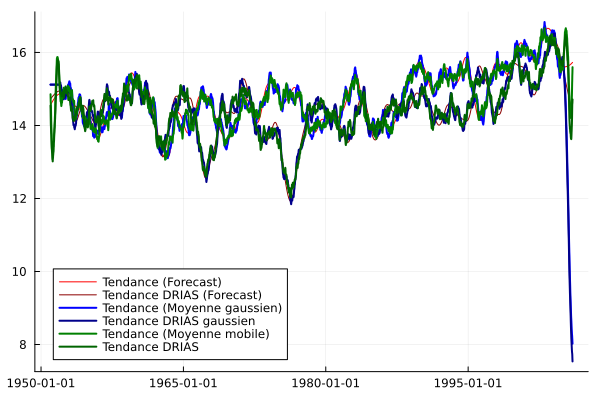

In [28]:
@df stl_df.decomposition plot(:Timestamp, :Trend,  main = "Tendances", label="Tendance (Forecast)", color=:red)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance DRIAS (Forecast)", color=:darkred)

plot!(df_daily.DATE, color=:blue, trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)
plot!(df_daily_drias.Date, color=:darkblue,trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)

plot!(df_daily.DATE, color=:green, palette =:tab10, trend_values, label="Tendance (Moyenne mobile)", linewidth=2)
plot!(df_daily_drias.Date, color=:darkgreen, palette =:tab10, trend_values_drias, label="Tendance DRIAS", linewidth=2)

### SAISONNALITÉ

Calcul à la main d'une saisonnalité

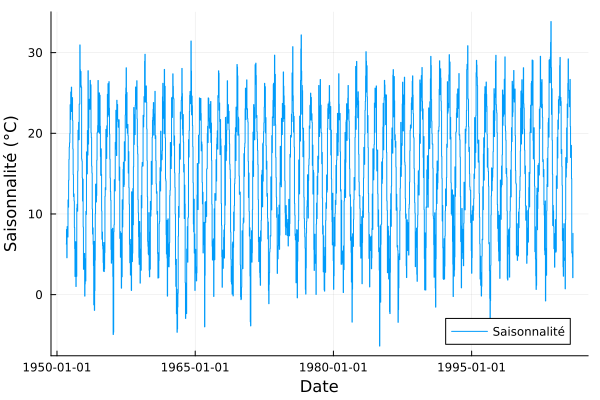

In [29]:

function saisonnalite(data::Vector{T}, period::Int) where T
    n = length(data)
    seasonal = similar(data, T) # Vecteur de la même taille et du meme type que data 
    seasonal_count = Int(ceil(n / period))
    
    seasonal_avg = similar(data, T)
    for i in 1:seasonal_count
        start_idx = (i - 1) * period + 1
        end_idx = min(i * period, n)
        seasonal_avg[start_idx:end_idx] .= mean(@view(data[start_idx:end_idx]))
    end
    
    for i in 1:n
        seasonal[i] = seasonal_avg[i]
    end
    
    return seasonal
end

# Calculer la saisonnalité avec une période saisonnière de 12 mois (par exemple)
seasonal_values = saisonnalite(df_daily.DAILY_MEAN, 12)

# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, seasonal_values, label="Saisonnalité", xlabel="Date", ylabel="Saisonnalité (°C)")


Saisonnalité avec Forecast

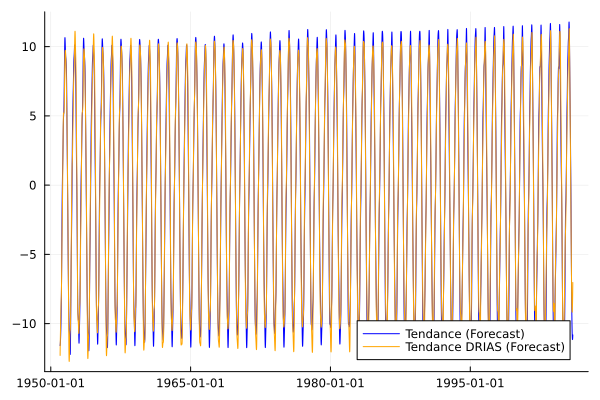

In [30]:
@df stl_df.decomposition plot(:Timestamp, :Seasonal,  main = "Tendances", label="Tendance (Forecast)", color=:blue)
@df stl_df_drias.decomposition plot!(:Timestamp, :Seasonal, label="Tendance DRIAS (Forecast)", color=:orange)

### BRUIT

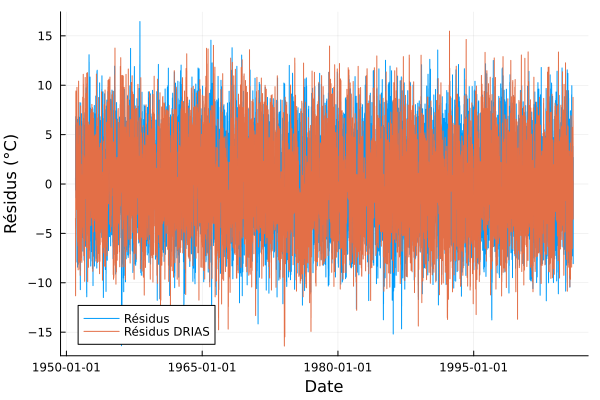

In [31]:

function retiresaisonnalite(data::Vector{T}) where T
    n = length(data)
    saisonnalite = stl_df.decomposition.Seasonal
    tendance = stl_df.decomposition.Trend
    
    for i in 1:n
        data[i] = data[i] - saisonnalite[i] - tendance[i]
    end
    
    return data
end

# Calculer la saisonnalité 
residus = retiresaisonnalite(df_daily.DAILY_MEAN)
residus_drias = retiresaisonnalite(df_daily_drias.DAILY_MEAN)


# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, residus, label="Résidus", xlabel="Date", ylabel="Résidus (°C)")
plot!(df_daily_drias.Date, residus_drias, label="Résidus DRIAS", xlabel="Date", ylabel="Résidus (°C)")

## Analyse des résidus

### Autocorrélogrammes de la série résiduelle

Autocorrélogramme partiel


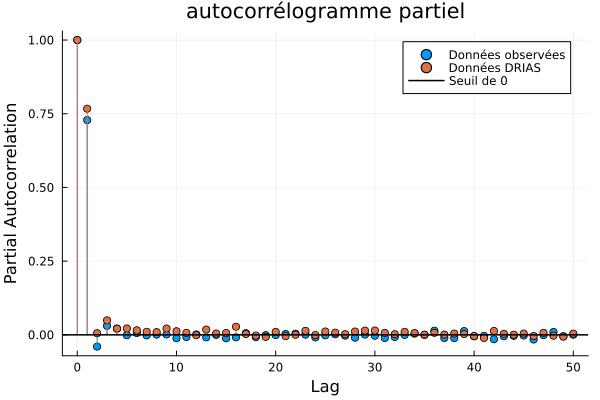

In [32]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values_res = StatsBase.pacf(residus, lags)
pacf_values_drias_res = StatsBase.pacf(residus_drias, lags)

plot(0:maxlag, pacf_values_res, label = "Données observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias_res, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

Autocorrélogramme simple


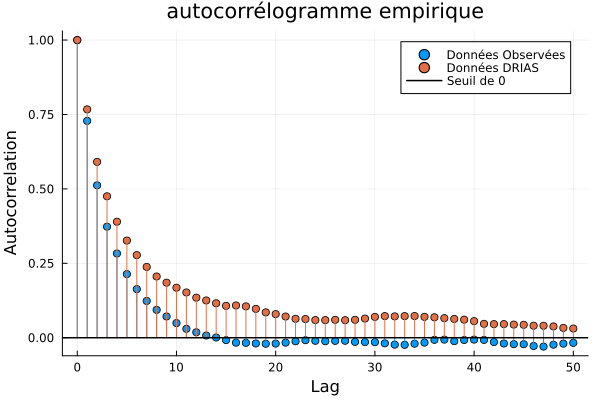

In [33]:
autocor_values = autocor(residus, lags)
autocor_values_drias = autocor(residus_drias, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="autocorrélogramme empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

Estimation des coefficients de l'AR(2)

In [34]:
# Construire les matrices pour l'ajustement AR(2)
n = length(residus)
X = hcat(residus[2:end-1], residus[1:end-2])
X_drias = hcat(residus_drias[2:end-1], residus_drias[1:end-2])
y_target = residus[3:end]
y_target_drias = residus_drias[3:end]

# Estimer les coefficients en utilisant les moindres carrés
coefficients = X \ y_target
coefficients_drias = X_drias \ y_target_drias


# Afficher les coefficients estimés
println("Coefficients estimés : ", coefficients)
println("Coefficients estimés pour DRIAS: ", coefficients_drias)



Coefficients estimés : [0.7575867729469308, -0.03992602949612979]
Coefficients estimés pour DRIAS: [0.76357548193376, 0.006182463866914525]
